Importing Libraries

In [ ]:
#importing required libraries

import numpy as np
import pandas as pd

import os
import gc
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from keras import Sequential
from keras.layers import Dense,BatchNormalization,Dropout,Activation,Flatten
from keras.layers import Lambda, Input, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam 
from keras.models import Model
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from keras.preprocessing.image import ImageDataGenerator,load_img


from tqdm.autonotebook import tqdm

import warnings
warnings.filterwarnings('ignore')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [ ]:
seed = 50
def seed_everything(seed):
    os.environ['PYTHONSEED'] = str(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
seed_everything(seed)

In [ ]:
#directories for data 
train_dir = 'Face Mask Dataset/Train' 
test_dir = 'Face Mask Dataset' 
val_dir = 'Face Mask Dataset/Validation'

In [ ]:
batch_size = 32
epochs = 5
learn_rate = 0.001
adam = Adam(lr=learn_rate, beta_1=0.9, beta_2=0.999, epsilon=None,  amsgrad=False)
input_shape = (120,120,3)

In [ ]:
! pip install kaggle

In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d ashishjangra27/face-mask-12k-images-dataset

 98% 323M/330M [00:02<00:00, 136MB/s]
100% 330M/330M [00:02<00:00, 150MB/s]


In [ ]:
!unzip /content/face-mask-12k-images-dataset.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1855.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1856.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1857.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1858.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1859.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1860.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1861.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1862.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1863.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1864.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1865.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1866.png  
  inflating: /content/Face Mask Dataset/Train/WithoutMask/1867.png  
  inflating: /content/Face Mask Dataset/Train/Withou

In [ ]:
datagen = ImageDataGenerator(
                    rotation_range = 30,
                    width_shift_range = 0.2,
                    height_shift_range = 0.2,
                    shear_range = 0.2,
                    zoom_range = 0.2,
                    brightness_range = [0.5,1.5],
                    horizontal_flip = True,
                    vertical_flip = True,
                    fill_mode = 'nearest')



datagen_val = ImageDataGenerator()
datagen_test = ImageDataGenerator()

In [ ]:
train_generator= datagen.flow_from_directory(directory=train_dir,
                                            class_mode="sparse", target_size=(input_shape[0],input_shape[0]), batch_size=batch_size,shuffle = True,
                                             seed = seed,interpolation = "nearest")

Found 10000 images belonging to 2 classes.


In [ ]:
val_generator=datagen_val.flow_from_directory(directory=val_dir,
                                            class_mode="sparse", target_size=(input_shape[0],input_shape[0]), batch_size=batch_size,shuffle = True,
                                             seed = seed,interpolation = "nearest")

Found 800 images belonging to 2 classes.


In [ ]:
test_generator = datagen_test.flow_from_directory(test_dir,
                                               batch_size = 1, 
                                               target_size =(input_shape[0],input_shape[0]),
                                                classes=['Test'], 
                                               color_mode ='rgb',
                                              seed = seed
                                               ) 

Found 992 images belonging to 1 classes.


In [ ]:
early_stopping = EarlyStopping(monitor = 'val_loss',
                               patience = 5,
                               mode = 'min',
                               restore_best_weights = True)


checkpoint = ModelCheckpoint('best_model.hdf5', 
                             monitor = 'val_loss',
                             verbose = 1,
                             mode = 'min', 
                             save_best_only = True)

reduce_lr = ReduceLROnPlateau(monitor = 'val_loss',
                              factor = 0.2,
                              patience = 3,
                              min_lr = 0.001,
                              mode = 'min',
                              verbose = 1)

In [ ]:
#//from tensorflow.keras.applications import EfficientNetB3
#effB3 = EfficientNetB3(input_shape = input_shape, include_top = False, weights = 'imagenet')

43950080/43941136 [==============================] - 0s 0us/step


In [ ]:
labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())
n_classes = len(labels)
print(labels) 
print(f'There are total {n_classes} number of classes present')

{0: 'WithMask', 1: 'WithoutMask'}
There are total 2 number of classes present


In [ ]:
def build_model(base_modelx):
    
    model = Sequential(base_modelx)
    model.add(GlobalAveragePooling2D())
    model.add(Dense(256,activation ='relu'))

    model.add(Dense(n_classes,activation='softmax'))
    
    print(model.summary())
    
    model.compile(loss = 'sparse_categorical_crossentropy',optimizer = adam,metrics =['accuracy'])
    
    return model

In [ ]:
model = build_model(effB3)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional)  (None, 4, 4, 1536)       10783535  
                                                                 
 global_average_pooling2d (G  (None, 1536)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_35 (Dense)            (None, 256)               393472    
                                                                 
 dense_36 (Dense)            (None, 2)                 514       
                                                                 
Total params: 11,177,521
Trainable params: 11,090,218
Non-trainable params: 87,303
_________________________________________________________________
None


In [ ]:
STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = val_generator.n//val_generator.batch_size

In [ ]:
#Training the model, requires GPU. The model was trained on 14 epochs and is stored in best_model.h5 file
model.fit(train_generator,
                    validation_data = val_generator,
                    epochs = epochs,
                    steps_per_epoch = STEP_SIZE_TRAIN,
                    validation_steps = STEP_SIZE_VALID,
                    callbacks = [early_stopping, checkpoint, reduce_lr]
                   )

Epoch 1/5
312/312 [==============================] - ETA: 0s - loss: 0.0848 - accuracy: 0.9715
Epoch 00001: val_loss improved from inf to 0.04564, saving model to best_model.hdf5
312/312 [==============================] - 141s 386ms/step - loss: 0.0848 - accuracy: 0.9715 - val_loss: 0.0456 - val_accuracy: 0.9887 - lr: 0.0010
Epoch 2/5
312/312 [==============================] - ETA: 0s - loss: 0.0356 - accuracy: 0.9866
Epoch 00002: val_loss improved from 0.04564 to 0.00124, saving model to best_model.hdf5
312/312 [==============================] - 116s 372ms/step - loss: 0.0356 - accuracy: 0.9866 - val_loss: 0.0012 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 3/5
312/312 [==============================] - ETA: 0s - loss: 0.0267 - accuracy: 0.9922
Epoch 00003: val_loss did not improve from 0.00124
312/312 [==============================] - 115s 367ms/step - loss: 0.0267 - accuracy: 0.9922 - val_loss: 0.0067 - val_accuracy: 0.9962 - lr: 0.0010
Epoch 4/5
312/312 [=============================

In [ ]:
pip install mtcnn

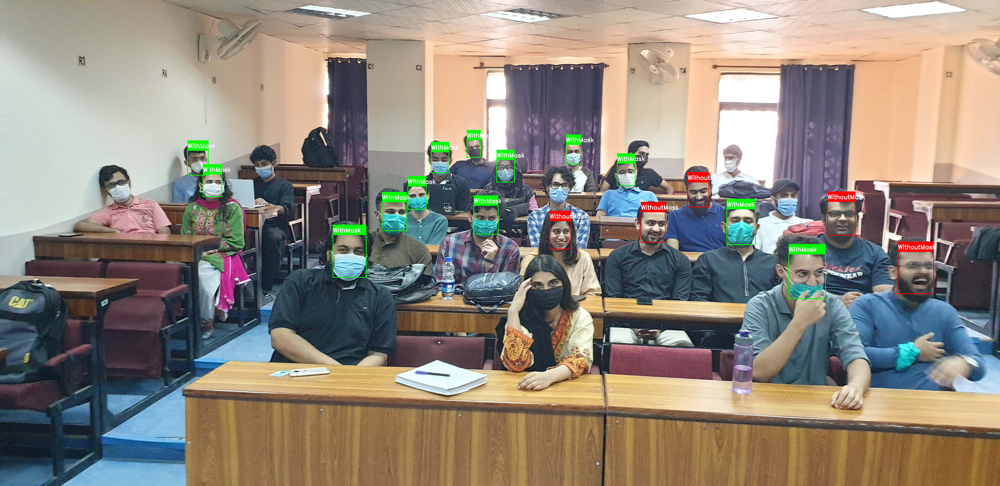

In [ ]:
#importing required libraries
import os
import numpy as np
import cv2
from keras.models import load_model
from google.colab.patches import cv2_imshow



#input shape on which we have trained our model

input_shape = (120,120,3)
labels_dict = {0: 'WithMask', 1: 'WithoutMask'}
color_dict = {0 : (0,255,0), 1:(0,0,255)} 
model = load_model('/content/drive/MyDrive/FYP/Weights/best_model.hdf5')

from mtcnn.mtcnn import MTCNN     #importing the model
detector = MTCNN()               


size = 2

im=cv2.imread('/content/drive/MyDrive/FYP/Dataset/Batch1/Collective/facemasks.jpg')
# Resize the image to speed up detection
mini = cv2.resize(im, (im.shape[1] // size, im.shape[0] // size))

rgb_image = cv2.cvtColor(mini, cv2.COLOR_BGR2RGB) 
detections = detector.detect_faces(mini)                 # detecting faces, this will give us x,y,w,h cordinates for every face detected

faces=[]
for detection in detections:
   score = detection["confidence"]
   if score > 0.65:
     faces.append(detection)


# Draw rectangles around each face
for f in faces:
  x, y, w, h = [v * size for v in f['box']]


  # cropping the face portion from the entire image
  face_img = im[y:y + h, x:x + w]
  resized = cv2.resize(face_img, (input_shape[0],input_shape[1])) # resizing the image

  reshaped = np.reshape(resized, (1, input_shape[0],input_shape[1], 3)) 
                                                               

  result = model.predict(reshaped) #predicting
  label = np.argmax(result, axis=1)[0] 
  
  cv2.rectangle(im, (x, y), (x + w, y + h), color_dict[label], 2) # Bounding box 
  cv2.rectangle(im, (x, y - 40), (x + w, y), color_dict[label], -1) 
  cv2.putText(im, labels_dict[label], (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2) 

# Show the image
cv2_imshow(im)

#Close all started windows
cv2.destroyAllWindows()